## Création du dataset 

In [11]:
data = []

for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(extensions):
            class_name = os.path.basename(dirpath)
            if "healthy" in class_name:
                has_disease = False
                disease_name = None
            else:
                has_disease = True
                disease_name = class_name.split("___")[1]
            species_name = class_name.split("___")[0]
            img_path = os.path.join(dirpath, filename)
            data.append((img_path, species_name, has_disease, disease_name))

data = pd.DataFrame(data, columns=["img_path", "espece", "malade", "nom_maladie"])

In [12]:
data.head()

,img_path,espece,malade,nom_maladie
0,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
1,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
2,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
3,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
4,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab


In [13]:
data.to_csv('data.csv', index=False)

## Analyses d'une image

In [14]:
img = cv2.imread(data.img_path[0])

In [15]:
display(type(img))
display(img.shape)
display(img.max())
img

numpy.ndarray

(256, 256, 3)

226

array([[[196, 163, 167],
        [195, 162, 166],
        [194, 161, 165],
        ...,
        [211, 182, 185],
        [209, 180, 183],
        [207, 178, 181]],

       [[199, 166, 170],
        [198, 165, 169],
        [197, 164, 168],
        ...,
        [212, 183, 186],
        [210, 181, 184],
        [209, 180, 183]],

       [[199, 166, 170],
        [198, 165, 169],
        [197, 164, 168],
        ...,
        [214, 185, 188],
        [212, 183, 186],
        [211, 182, 185]],

       ...,

       [[124,  90, 100],
        [126,  92, 102],
        [128,  94, 104],
        ...,
        [137, 110, 126],
        [137, 110, 126],
        [137, 110, 126]],

       [[125,  91, 101],
        [126,  92, 102],
        [127,  93, 103],
        ...,
        [133, 106, 122],
        [134, 107, 123],
        [134, 107, 123]],

       [[128,  94, 104],
        [127,  93, 103],
        [126,  92, 102],
        ...,
        [132, 105, 121],
        [133, 106, 122],
        [134, 107, 123]]

## Distribution des pixels

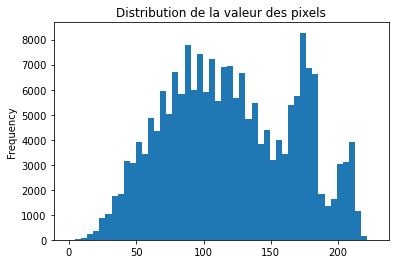

In [16]:
import matplotlib.pyplot as plt

pd.Series(img.flatten()).plot(kind = 'hist',
                              bins = 50,
                              title = 'Distribution de la valeur des pixels')

plt.show()

## Affichage

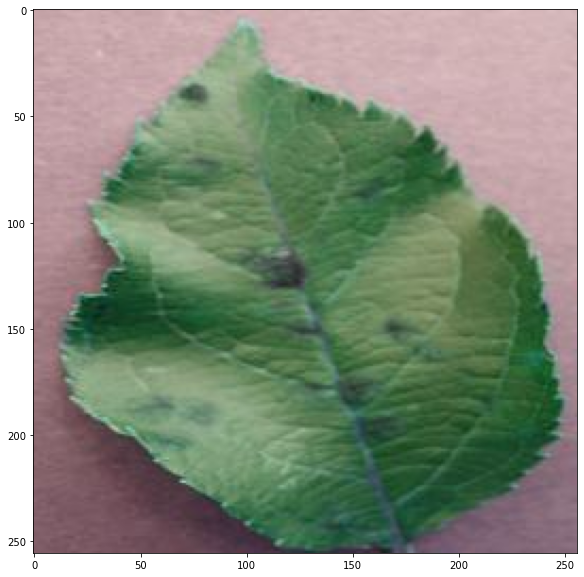

In [17]:
fig, ax = plt.subplots(figsize = (10,10))

ax.imshow(img)
ax.axis

plt.show()

## Les canaux (RGB)

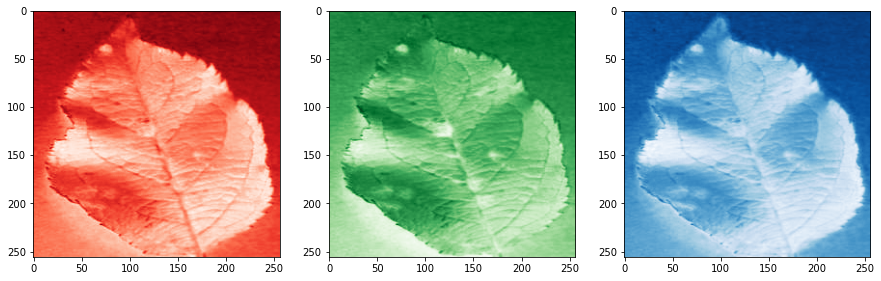

In [19]:
fig, axs = plt.subplots(1,3,figsize = (15,5))

axs[0].imshow(img[:,:,0], cmap = 'Reds')
axs[1].imshow(img[:,:,1], cmap = 'Greens')
axs[2].imshow(img[:,:,2], cmap = 'Blues')

## En gris

In [20]:
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

display(img_gris.shape)

(256, 256)

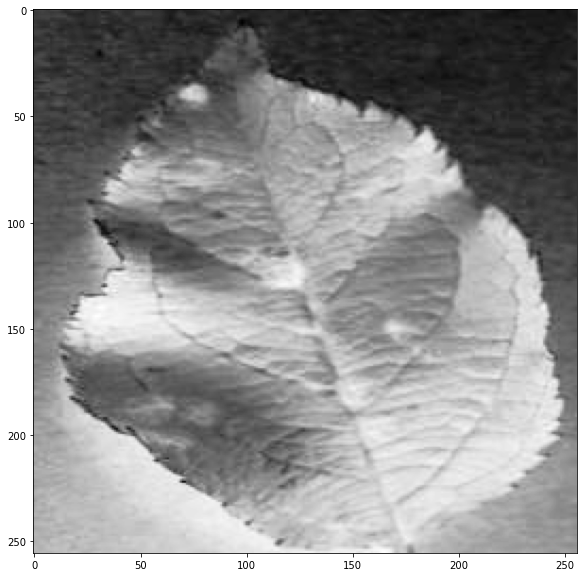

In [21]:
fig, ax = plt.subplots(figsize = (10,10))

ax.imshow(img_gris, cmap = 'Greys')

## Contours de la feuille 

In [22]:
contours, hierarchy = cv2.findContours(img_gris, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

print("Nombre de contours = {}".format(len(contours)))

Nombre de contours = 1


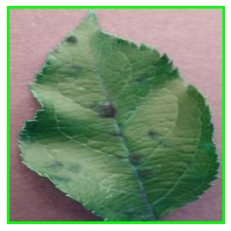

In [23]:
img_copy = img.copy()

cv2.drawContours(img_copy, contours, -1, (0,255,0), 3)

plt.imshow(img_copy[:,:,::-1]);plt.axis("off");

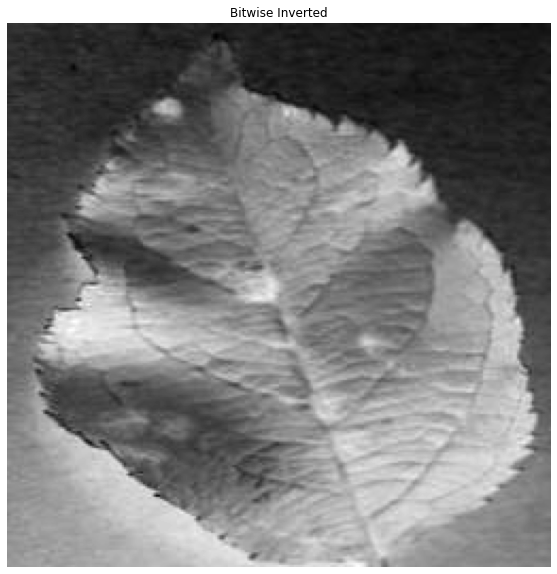

In [24]:
gray_inverted = cv2.bitwise_not(img_gris)

fig, ax = plt.subplots(figsize = (10,10))

ax.imshow(gray_inverted ,cmap="gray");plt.title("Bitwise Inverted");plt.axis("off");

## Orientation

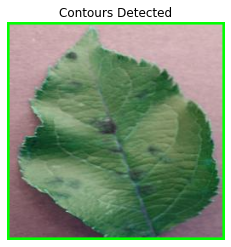

In [25]:
contours, hierarchy = cv2.findContours(gray_inverted, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

cv2.drawContours(img_copy, contours, -1, (0, 255, 0), 2)

plt.imshow(img_copy[:,:,::-1]);plt.title("Contours Detected");plt.axis("off");

In [26]:
# Seuillage binaire 

ret, thresh = cv2.threshold(img_gris, 150, 255, cv2.THRESH_BINARY)

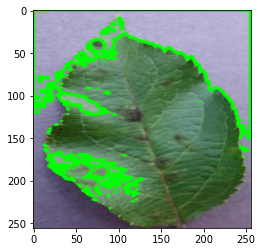

In [27]:
contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
                                      
image_copy = img.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

plt.imshow(image_copy)

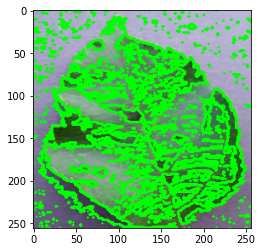

In [28]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

thresh = cv2.adaptiveThreshold(gray, 265, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 45, 5)

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_contours = cv2.drawContours(img.copy(), contours, -1, (0,255,0), 2)

plt.imshow(img_contours)

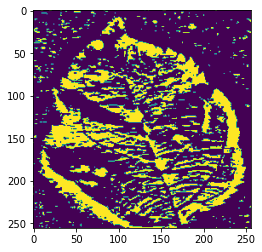

In [29]:
display(plt.imshow(thresh))

In [30]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

blur = cv2.GaussianBlur(thresh, (3,3), 0)

contours, _ = cv2.findContours(blur, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

big_contour = max(contours, key=cv2.contourArea)

ellipse = cv2.fitEllipse(big_contour)

img_contours = cv2.drawContours(img.copy(), [big_contour], 0, (0,255,0), 2)
cv2.ellipse(img_contours, ellipse, (0,0,255), 2)

array([[[167, 163, 196],
        [166, 162, 195],
        [165, 161, 194],
        ...,
        [185, 182, 211],
        [183, 180, 209],
        [181, 178, 207]],

       [[170, 166, 199],
        [169, 165, 198],
        [168, 164, 197],
        ...,
        [186, 183, 212],
        [184, 181, 210],
        [183, 180, 209]],

       [[170, 166, 199],
        [169, 165, 198],
        [168, 164, 197],
        ...,
        [188, 185, 214],
        [186, 183, 212],
        [185, 182, 211]],

       ...,

       [[  0, 255,   0],
        [  0, 255,   0],
        [104,  94, 128],
        ...,
        [126, 110, 137],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]]

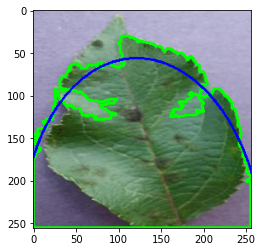

In [31]:
plt.imshow(img_contours)

In [32]:
blur = cv2.GaussianBlur(thresh, (3,3), 0)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
opening = cv2.morphologyEx(blur, cv2.MORPH_OPEN, kernel, iterations=3)

contours, _ = cv2.findContours(opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
big_contour = max(contours, key=cv2.contourArea)

peri = cv2.arcLength(big_contour, True)
approx = cv2.approxPolyDP(big_contour, 0.02*peri, True)

In [33]:
ellipse = cv2.fitEllipse(approx)
cv2.ellipse(img_contours, ellipse, (0, 0, 255), 2)

array([[[167, 163, 196],
        [166, 162, 195],
        [165, 161, 194],
        ...,
        [185, 182, 211],
        [183, 180, 209],
        [181, 178, 207]],

       [[170, 166, 199],
        [169, 165, 198],
        [168, 164, 197],
        ...,
        [186, 183, 212],
        [184, 181, 210],
        [183, 180, 209]],

       [[170, 166, 199],
        [169, 165, 198],
        [168, 164, 197],
        ...,
        [188, 185, 214],
        [186, 183, 212],
        [185, 182, 211]],

       ...,

       [[  0, 255,   0],
        [  0, 255,   0],
        [104,  94, 128],
        ...,
        [126, 110, 137],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]]

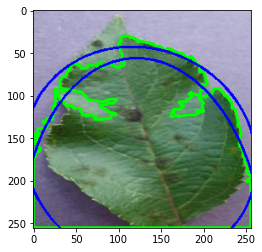

In [34]:
plt.imshow(img_contours)

In [35]:
ellipse = cv2.fitEllipse(approx)

angle = ellipse[2]

if 45 <= angle <= 135:
    orientation = "haut"
elif -45 <= angle <= 45 or 135 <= angle <= 225:
    orientation = "droite"
elif 225 <= angle <= 315:
    orientation = "bas"
else:
    orientation = "gauche"

print("Orientation de la feuille : ", orientation)

Orientation de la feuille :  haut


La technique de l'ellipse n'a pas pu être généralisée

Nous allons essayer une autre technique : celle des lignes de l'image

La feuille est orientée vers le haut


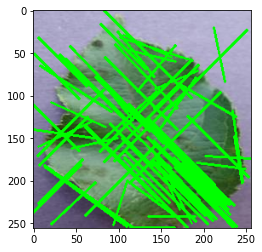

In [93]:
img = cv2.imread(data.iloc[0]['img_path'])

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)

lines = cv2.HoughLinesP(thresh, 1, np.pi/180, threshold=50, minLineLength=50, maxLineGap=5)

theta_sum = 0
n_lines = len(lines)
for line in lines:
    x1, y1, x2, y2 = line[0]
    theta_sum += np.arctan2(y2-y1, x2-x1)
theta_mean = theta_sum / n_lines
theta_deg = np.rad2deg(theta_mean)

if theta_deg > 45 and theta_deg <= 135:
    print("La feuille est orientée vers la gauche")
elif theta_deg > 135 or theta_deg <= -135:
    print("La feuille est orientée vers le bas")
elif theta_deg > -135 and theta_deg <= -45:
    print("La feuille est orientée vers la droite")
else:
    print("La feuille est orientée vers le haut")

img_lines = img.copy()
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB))

Test sur 50 images sélectionnées aléatoirement

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Peach___healthy\0c387b80-6b69-4b54-9ec5-e2ebdabdff83___Rutg._HL 3706_new30degFlipLR.JPG est orientée vers le haut


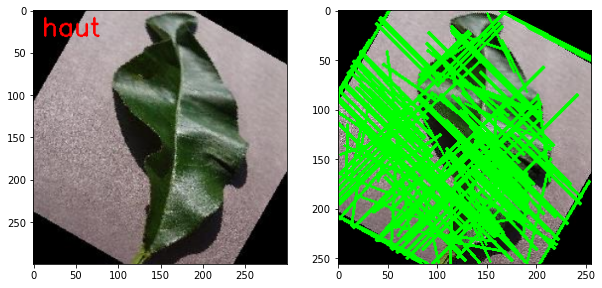

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Peach___healthy\5809f92c-0271-4001-8529-28eb0d706527___Rutg._HL 3522_90deg.JPG est orientée vers le haut


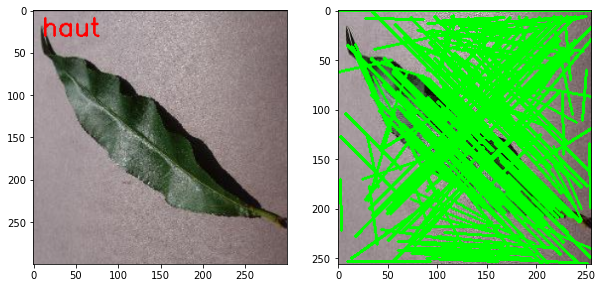

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Pepper,_bell___healthy\489667ae-bca0-4e52-819f-2e04be3ae8cd___JR_HL 8726.JPG est orientée vers le haut


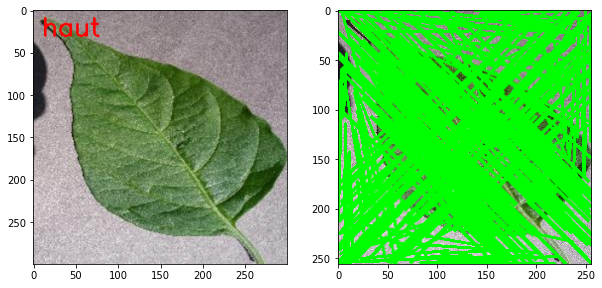

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___healthy\11a9b188-754b-45b5-a498-590bfdeb2643___Mt.N.V_HL 6159.JPG est orientée vers le haut


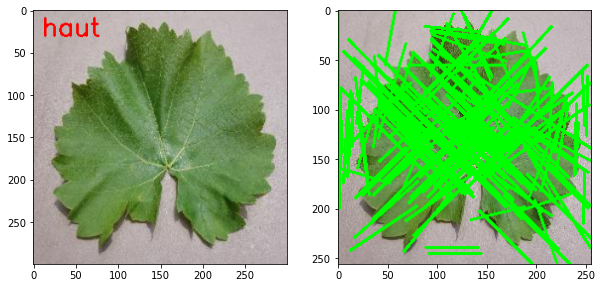

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___Black_rot\c70df019-6020-47a8-9b69-891a4f4d707b___FAM_B.Rot 3571_flipLR.JPG est orientée vers le haut


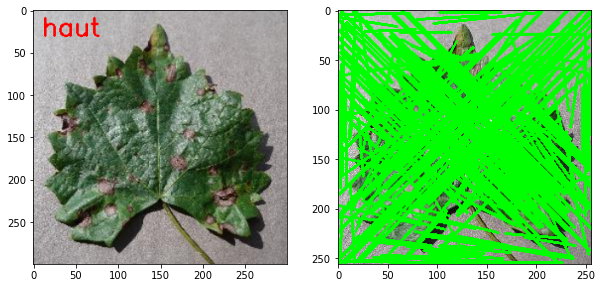

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Raspberry___healthy\894cf725-37b5-498f-beae-d1a9a3e32bac___Mary_HL 6388_270deg.JPG est orientée vers le haut


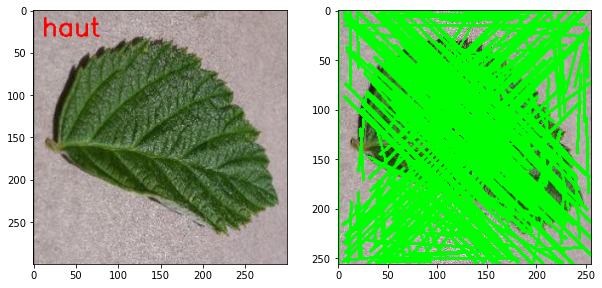

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Soybean___healthy\e3cfbded-895c-47bc-9df9-9bc404361460___RS_HL 4506.JPG est orientée vers le haut


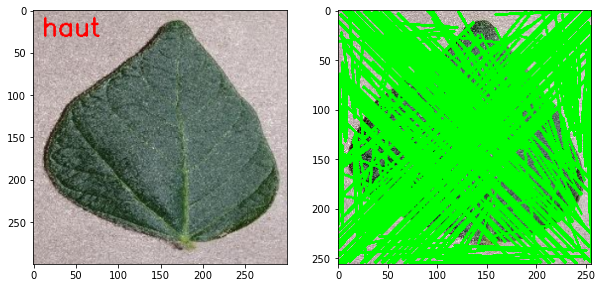

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Squash___Powdery_mildew\3fcecacc-248a-44ce-9d3c-acdc98027317___UMD_Powd.M 0019.JPG est orientée vers le haut


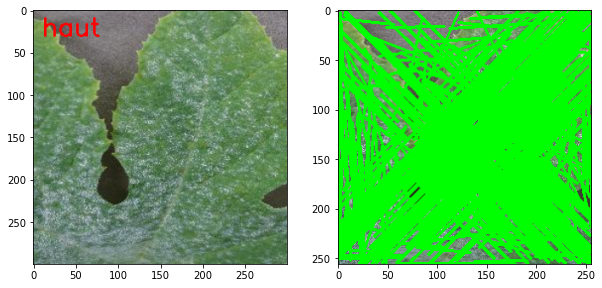

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___Target_Spot\7fd4f12e-758d-4965-a98f-c59bb9983e31___Com.G_TgS_FL 8211.JPG est orientée vers le haut


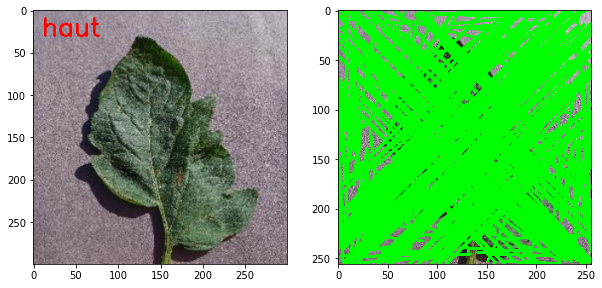

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Pepper,_bell___Bacterial_spot\b766708d-5d33-4034-afc8-fbf9ffece733___JR_B.Spot 9037.JPG est orientée vers le haut


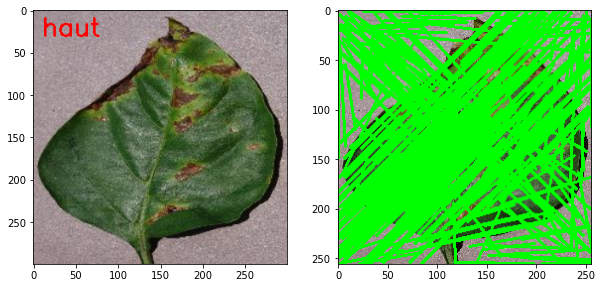

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Soybean___healthy\86408366-c846-4f1b-8088-21b9fe7ef69f___RS_HL 3908.JPG est orientée vers le haut


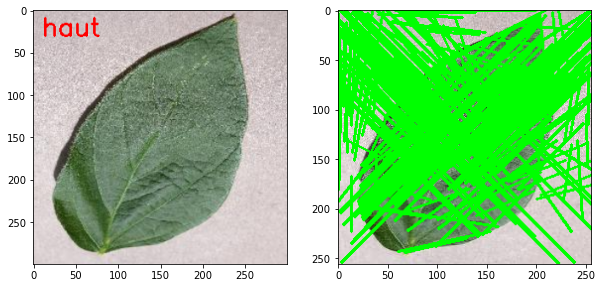

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___healthy\71c06efe-089f-49b3-beed-095bd7640e32___RS_HL 1947_new30degFlipLR.JPG est orientée vers le haut


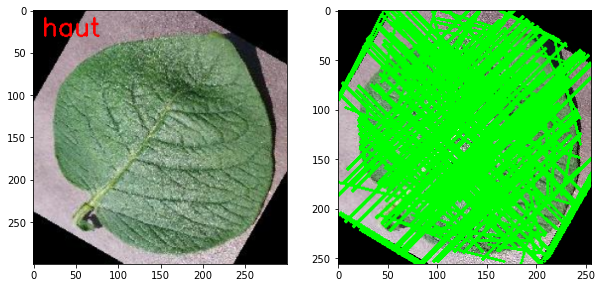

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___healthy\198fbad6-0192-4263-96c8-74c330667d61___Mt.N.V_HL 9032_90deg.JPG est orientée vers le haut


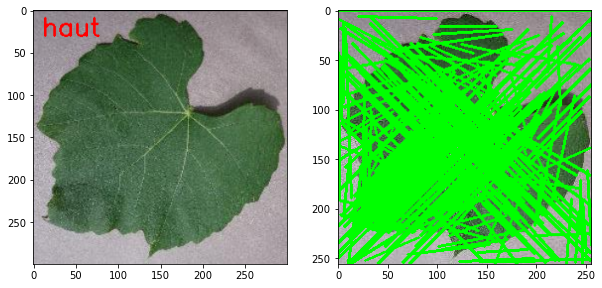

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___Leaf_Mold\d97b4cea-9445-4051-bc20-f8421dac0d4b___Crnl_L.Mold 6704.JPG est orientée vers le haut


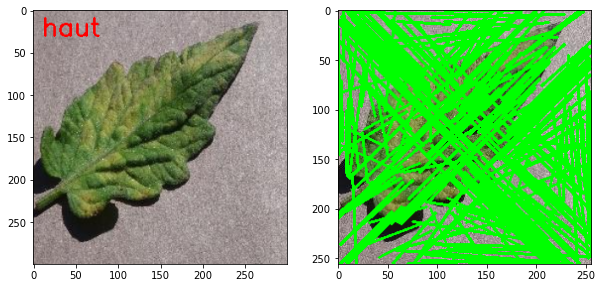

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Raspberry___healthy\3a764e05-74ea-4f1d-af6c-3ac4ddc25357___Mary_HL 6234_180deg.JPG est orientée vers le haut


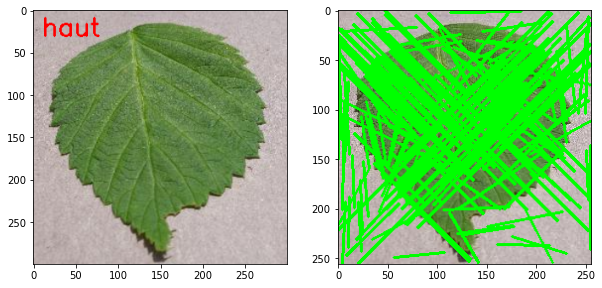

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___Black_rot\3d33710d-c091-4dae-a491-ef813ea2d34b___JR_FrgE.S 2885_90deg.JPG est orientée vers le haut


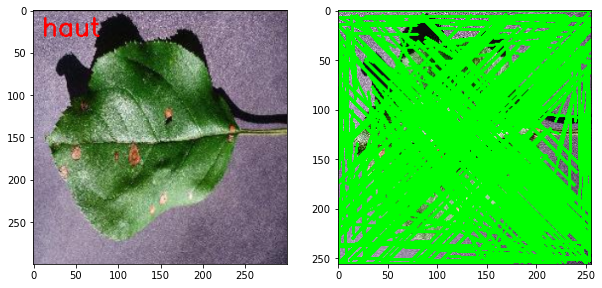

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___Late_blight\b811c2af-734e-4689-aa43-4ab1d4faec32___RS_LB 4719_flipTB.JPG est orientée vers le haut


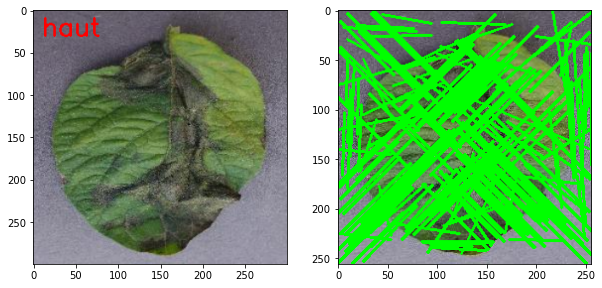

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Pepper,_bell___healthy\bb0abefe-b415-45ac-b56c-c54ab1c5eb76___JR_HL 8393.JPG est orientée vers le haut


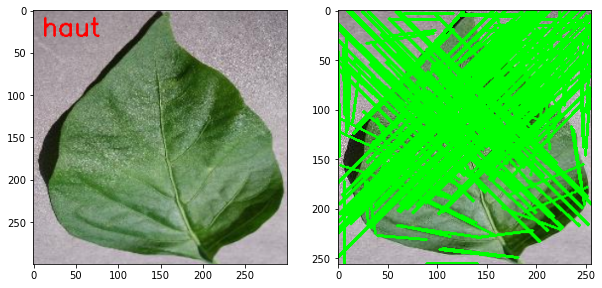

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___healthy\8665efd2-fa3d-45f8-b1c0-746c99fb7d1e___RS_HL 1924_flipTB.JPG est orientée vers le haut


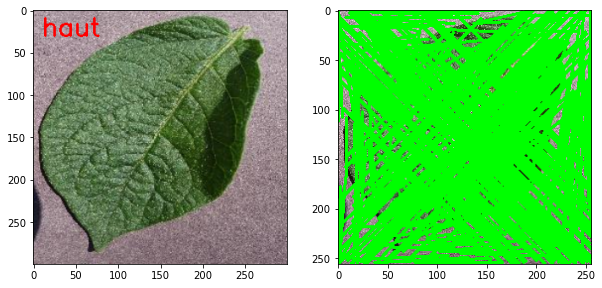

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___Black_rot\27292fc6-b4d8-4c2c-b0a8-36d4abf2a1a9___FAM_B.Rot 0643.JPG est orientée vers le haut


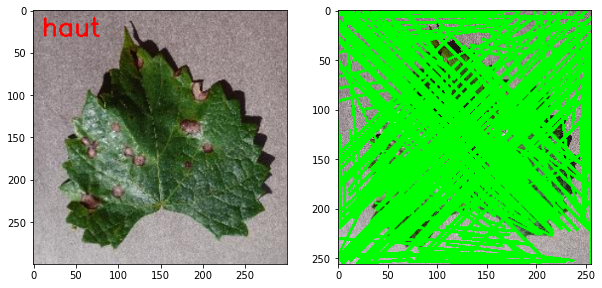

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Peach___healthy\6fa36443-d89d-45ac-aabb-33d83f452116___Rutg._HL 3561.JPG est orientée vers le haut


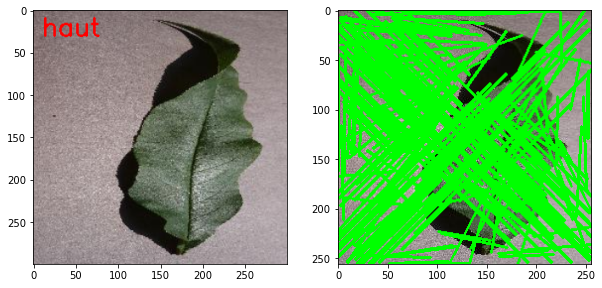

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Cherry_(including_sour)___healthy\3701b877-df2b-49cd-9bb9-066dd6f2f206___JR_HL 9734.JPG est orientée vers le haut


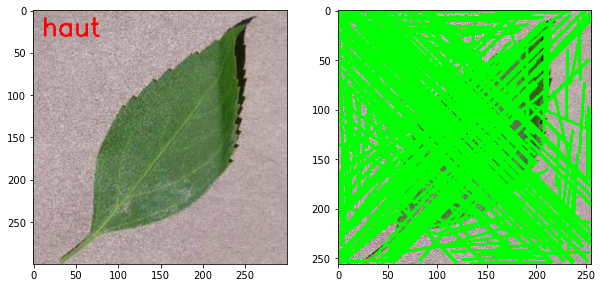

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Soybean___healthy\56778478-41a1-41d3-8fff-828c5055b0dd___RS_HL 5680 1.JPG est orientée vers le haut


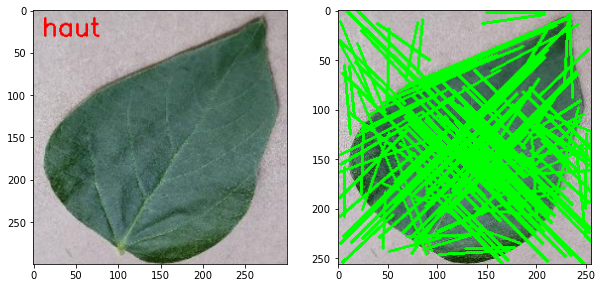

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Raspberry___healthy\75516457-ea59-483c-821c-5f173575702f___Mary_HL 9225_180deg.JPG est orientée vers le haut


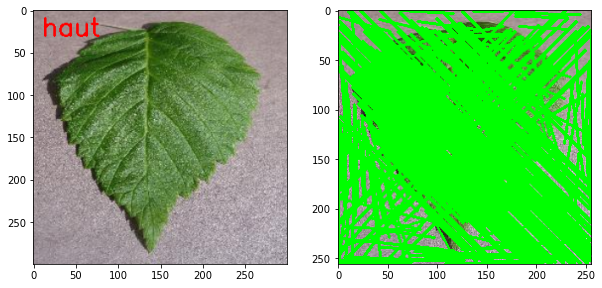

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Pepper,_bell___Bacterial_spot\ad91f8c2-0505-4b62-8395-370d3ae23c68___NREC_B.Spot 9071.JPG est orientée vers le haut


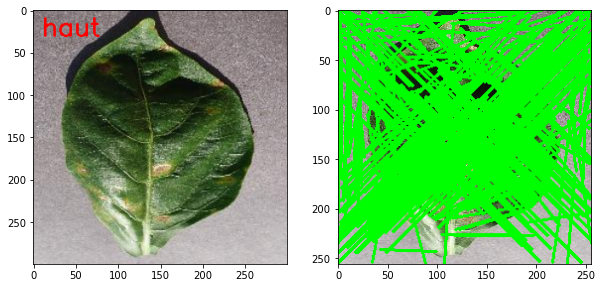

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___healthy\3df51cfe-b583-40ae-a2d5-d4928a8a763f___RS_HL 9765_new30degFlipLR.JPG est orientée vers le haut


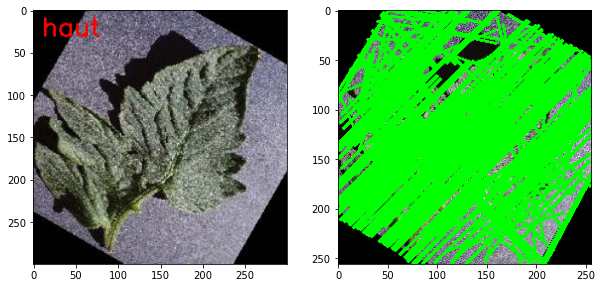

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Corn_(maize)___Common_rust_\RS_Rust 2149_flipLR.JPG est orientée vers le haut


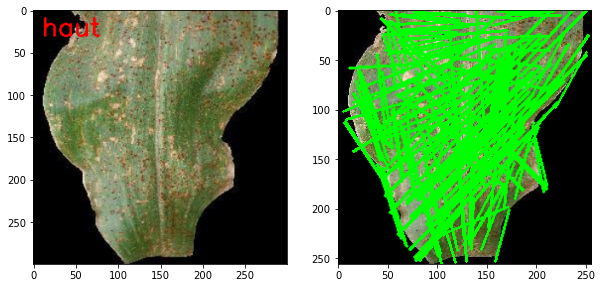

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___Black_rot\df0e8bc3-8244-4843-8d54-0593a6f2ee05___JR_FrgE.S 2743_270deg.JPG est orientée vers le haut


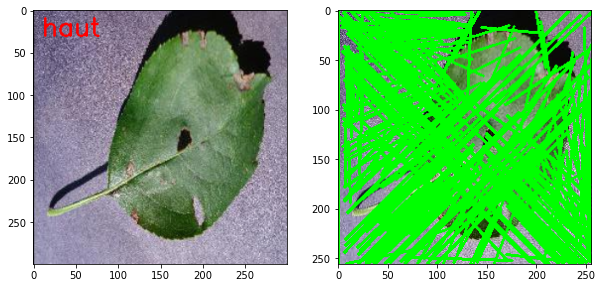

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Corn_(maize)___healthy\512a6f84-c287-4f78-bfbe-311bbf1ca548___R.S_HL 0626 copy_flipLR.jpg est orientée vers le haut


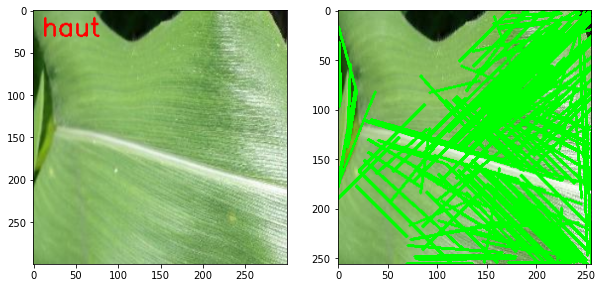

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___Late_blight\7bf67e1e-57c8-4f68-bc5a-56b2a69f30ec___RS_LB 2509.JPG est orientée vers le haut


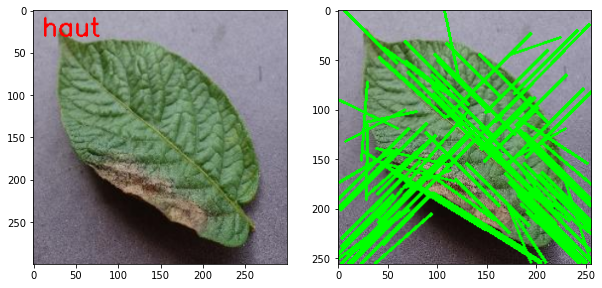

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___Esca_(Black_Measles)\cd837043-ba7c-4499-b266-a821dc1b83d2___FAM_B.Msls 1807.JPG est orientée vers le haut


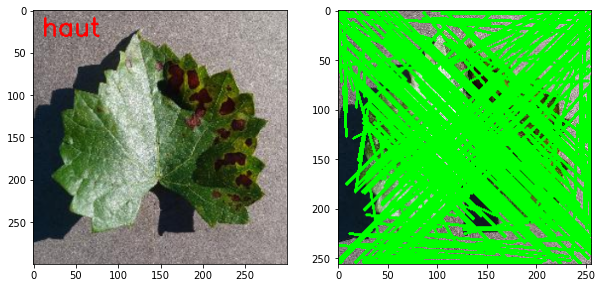

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Strawberry___healthy\f34a22a5-fa67-436d-872e-bdff52296a9b___RS_HL 2148_new30degFlipLR.JPG est orientée vers le haut


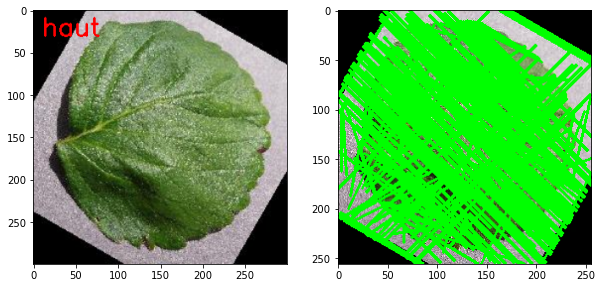

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Raspberry___healthy\6f4c7d33-4f72-44e7-9354-2e8e86fcd304___Mary_HL 9191_270deg.JPG est orientée vers le haut


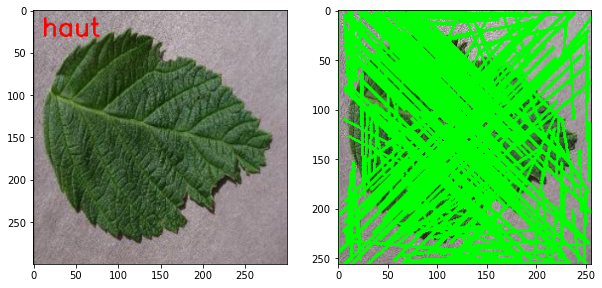

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___Late_blight\d7e7afff-cb91-4209-bf42-ce579f273cce___RS_LB 4468_flipTB.JPG est orientée vers le haut


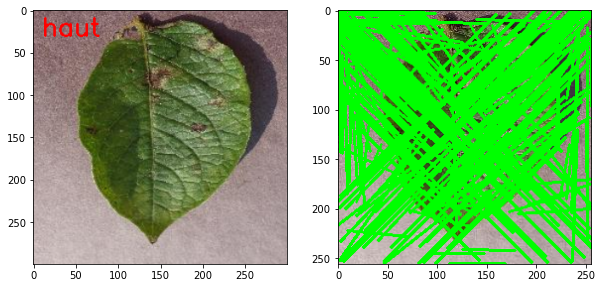

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___healthy\51a03694-82cd-43a5-9877-ddce42c1a5ad___RS_HL 1779_180deg.JPG est orientée vers le haut


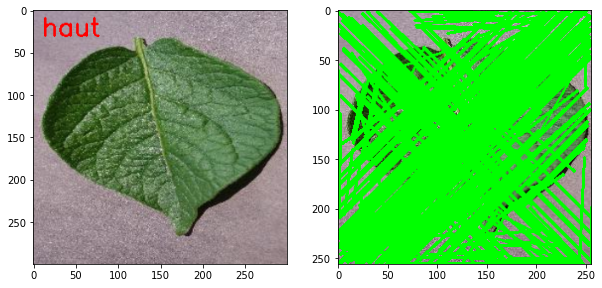

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___Tomato_mosaic_virus\5c49d086-dc47-480e-b5b1-0b69bacb66bf___PSU_CG 2241.JPG est orientée vers le haut


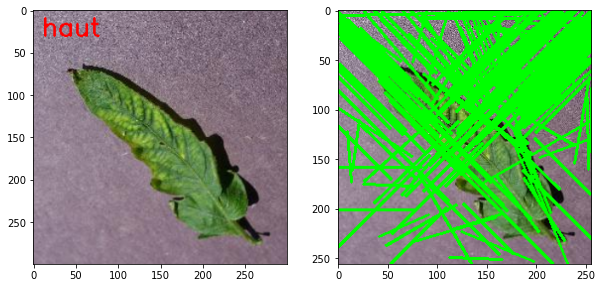

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___Early_blight\ee083b4e-3abc-4d9a-8395-de6c8ee27331___RS_Erly.B 9525_180deg.JPG est orientée vers le haut


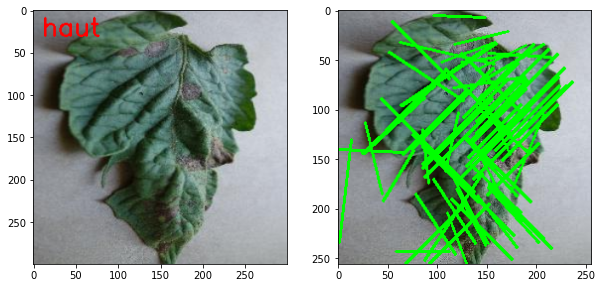

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___Black_rot\34eb19d8-32a9-4c9b-829f-d0ed705c5f03___JR_FrgE.S 3064.JPG est orientée vers le haut


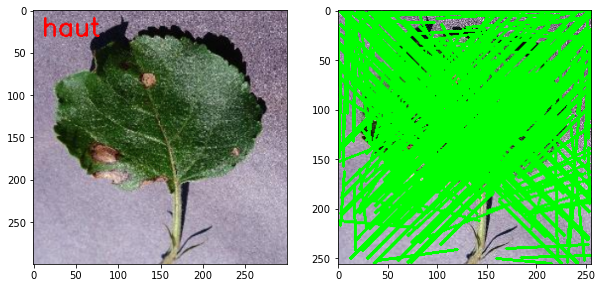

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___Black_rot\a38a8891-5883-4cfd-9718-2566dccfa114___JR_FrgE.S 8670.JPG est orientée vers le haut


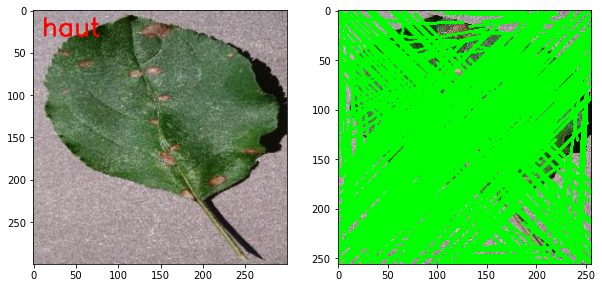

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___healthy\b6c49725-ccb9-46a9-abca-c99f51e13d0a___Mt.N.V_HL 6026_new30degFlipLR.JPG est orientée vers le haut


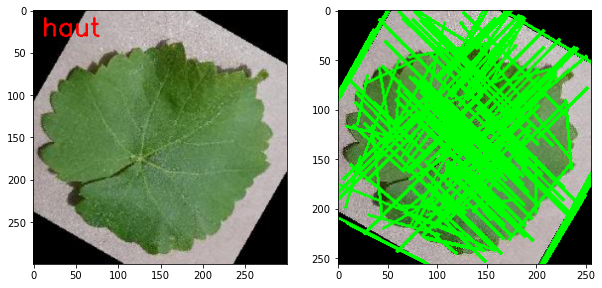

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___Black_rot\51beded3-3dc0-4f1f-a6b9-45c74612b9a1___FAM_B.Rot 3005.JPG est orientée vers le haut


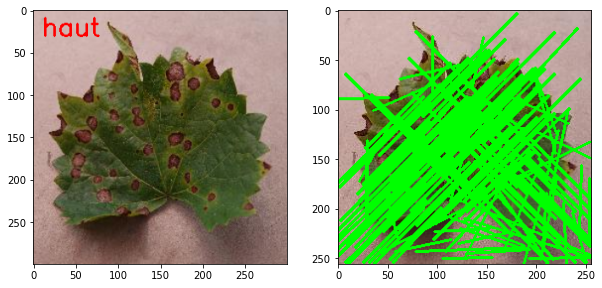

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___healthy\ac83e870-8aec-4b1a-8156-b9a60fa09259___RS_HL 5735.JPG est orientée vers le haut


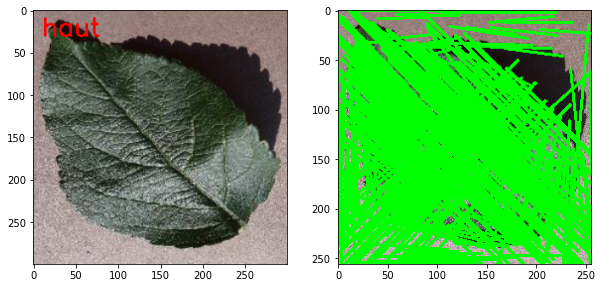

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___Late_blight\025f3c76-6d6c-4dad-ba22-e3e72d084ef1___RS_LB 3105.JPG est orientée vers le haut


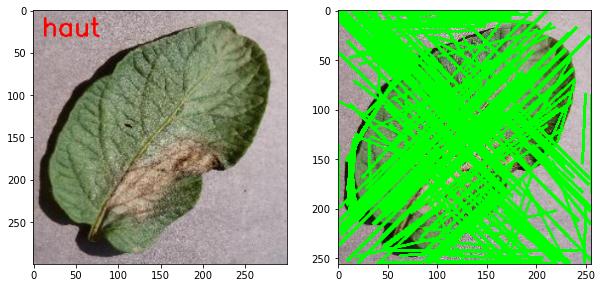

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Apple___healthy\51e68778-c3ba-423c-8fb8-bc5d1c20645a___RS_HL 7302.JPG est orientée vers le haut


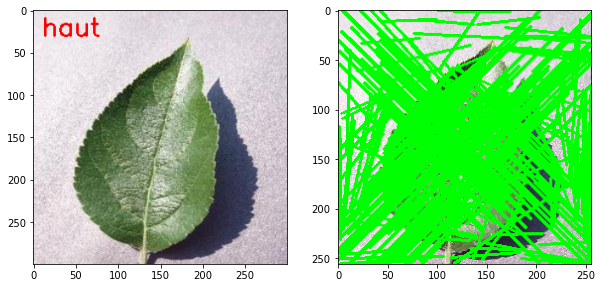

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Strawberry___healthy\1faaac0a-ea12-4085-af35-ab8b70bbf60a___RS_HL 4725.JPG est orientée vers le haut


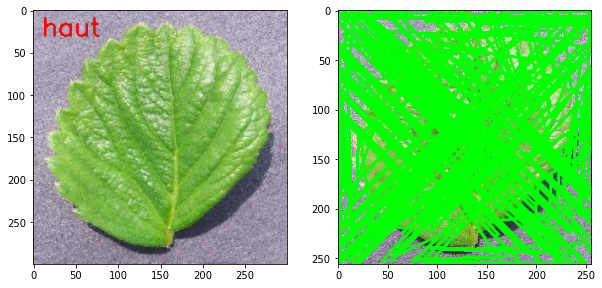

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Grape___Esca_(Black_Measles)\327d4657-b463-4bb5-86be-cd7d482557d0___FAM_B.Msls 4451.JPG est orientée vers le haut


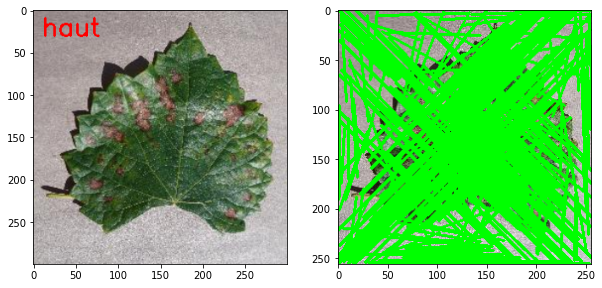

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Tomato___Septoria_leaf_spot\d7faf499-18df-4481-8d07-3d7168c83022___Matt.S_CG 7785.JPG est orientée vers le haut


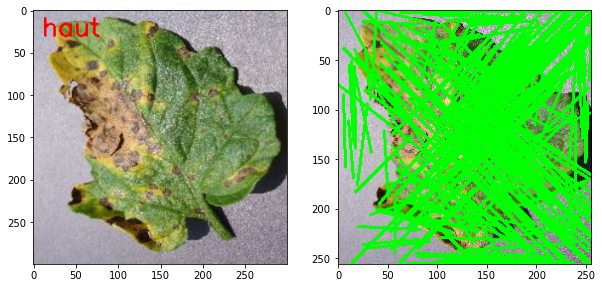

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Potato___Late_blight\1f84da28-3025-4cc0-8815-5b6b60205956___RS_LB 3326.JPG est orientée vers le haut


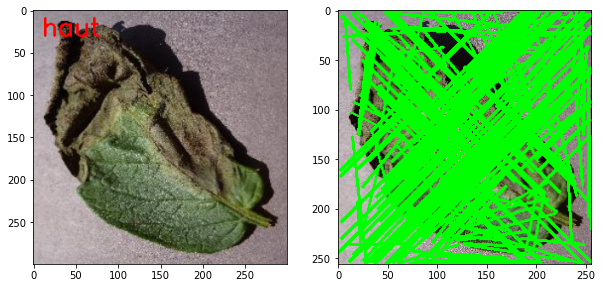

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Soybean___healthy\cfa54446-5b27-4d48-b62f-9417dbf8c463___RS_HL 5845.JPG est orientée vers le haut


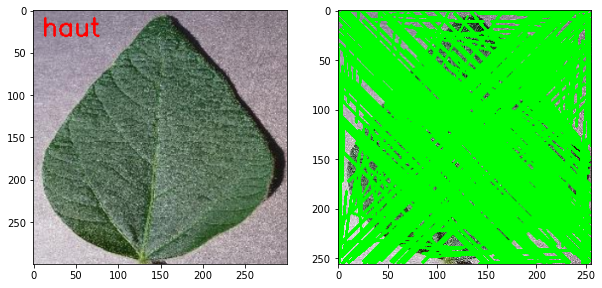

L'image C:\Users\aissa\Documents\DataScientest\Projet\Exploration\new_plant_diseases_dataset\New Plant Diseases Dataset(Augmented)\train\Pepper,_bell___healthy\e345cce1-fc94-4d67-b216-d23866e79e58___JR_HL 5992.JPG est orientée vers le haut


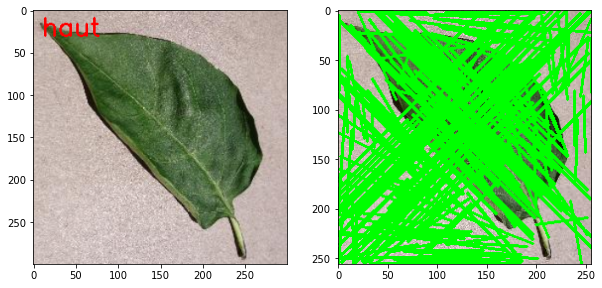

In [105]:
import random

# Chargement du dataset
image_paths = data["img_path"].tolist()

# Sélection aléatoire de 10 images
images = random.sample(image_paths, 50)

for img_path in images:
    img = cv2.imread(img_path)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    lines = cv2.HoughLinesP(thresh, 1, np.pi/180, threshold=50, minLineLength=50, maxLineGap=5)
    theta_sum = 0
    n_lines = len(lines)
    for line in lines:
        x1, y1, x2, y2 = line[0]
        theta_sum += np.arctan2(y2-y1, x2-x1)
    theta_mean = theta_sum / n_lines
    theta_deg = np.rad2deg(theta_mean)

    if theta_deg > 45 and theta_deg <= 135:
        orientation = "gauche"
    elif theta_deg > 135 or theta_deg <= -135:
        orientation = "bas"
    elif theta_deg > -135 and theta_deg <= -45:
        orientation = "droite"
    else:
        orientation = "haut"
    print("L'image", img_path, "est orientée vers le", orientation)

    img_lines = img.copy()
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

    img_display = cv2.imread(img_path)
    img_display = cv2.resize(img_display, (300, 300))
    img_display = cv2.putText(img_display, orientation, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
    ax[1].imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB))
    plt.show()

La technique n'est pas très pertinente

## Étude de la corrélation entre 2 images

Nous allons étudier la corrélation entre 2 images de la même espèces (apple) : une saine, une malade

In [36]:
data

,img_path,espece,malade,nom_maladie
0,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
1,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
2,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
3,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
4,C:\Users\aissa\Documents\DataScientest\Projet\...,Apple,True,Apple_scab
...,...,...,...,...
47963,C:\Users\aissa\Documents\DataScientest\Projet\...,Tomato,True,Tomato_mosaic_virus
47964,C:\Users\aissa\Documents\DataScientest\Projet\...,Tomato,True,Tomato_mosaic_virus
47965,C:\Users\aissa\Documents\DataScientest\Projet\...,Tomato,True,Tomato_mosaic_virus
47966,C:\Users\aissa\Documents\DataScientest\Projet\...,Tomato,True,Tomato_mosaic_virus


In [50]:
img_malade = data[(data['espece'] == 'Apple') & (data['malade'] == True)].iloc[1]['img_path']
img_non_malade = data[(data['espece'] == 'Apple') & (data['malade'] == False)].iloc[1]['img_path']

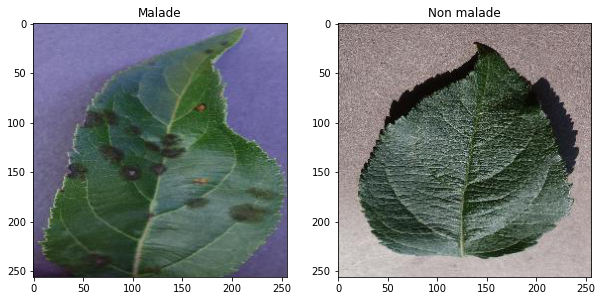

In [51]:
import matplotlib.image as mpimg

fig, axs = plt.subplots(1, 2, figsize=(10,5))

img1 = mpimg.imread(img_malade)
axs[0].imshow(img1)
axs[0].set_title('Malade')

img2 = mpimg.imread(img_non_malade)
axs[1].imshow(img2)
axs[1].set_title('Non malade')

plt.show()

Détection des points d'intêrets

In [81]:
import cv2

img1 = cv2.imread(img_malade)
img2 = cv2.imread(img_non_malade)

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

result = cv2.matchTemplate(gray1, gray2, cv2.TM_CCOEFF_NORMED)

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

print("Coefficient de corrélation maximal : ", max_val)

Coefficient de corrélation maximal :  0.1077040284872055


L'étude de corrélation ne semble pas très pertinente à priori pour les images

## Étude des points d'intêrets d'une image

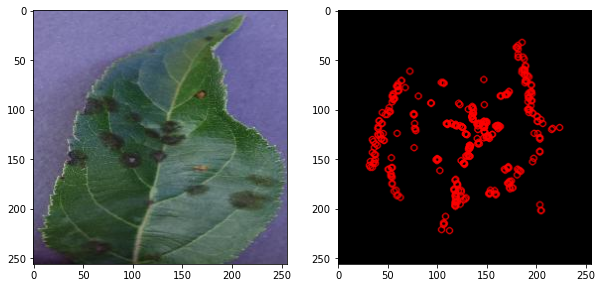

In [77]:
img = cv2.imread(img_malade)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
detector = cv2.ORB_create()
kp = detector.detect(gray, None)
out_img = np.zeros_like(img)

result = cv2.addWeighted(img, 0.5, out_img, 0.5, 0)
cv2.drawKeypoints(img, kp, out_img, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(out_img)




plt.show()

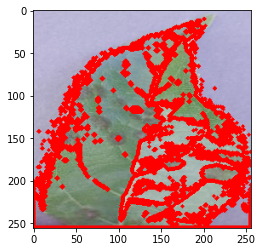

In [79]:
gamma = 1.5
lut = np.array([((i/255.0)**(1/gamma))*255 for i in np.arange(0,256)]).astype('uint8')
img = cv2.LUT(img, lut)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.equalizeHist(gray)

thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)[1]

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0,0,255), 3)

plt.imshow(cv2.cvtColor(img_contours, cv2.COLOR_BGR2RGB))
plt.show()

In [1]:
!pip install nbmanips

In [7]:
import nbformat as nbf

# Charger le notebook actuel
with open('Exploration - New Plant Diseases Dataset.ipynb', 'r') as f:
    notebook = nbf.read(f, as_version=nbf.NO_CONVERT)

# Rechercher la première cellule Markdown contenant le texte spécifié
split_cells = notebook['cells'][10:]

# Créer un nouveau notebook avec les cellules sélectionnées
split_notebook = nbf.v4.new_notebook(cells=split_cells)

# Enregistrer le notebook fractionné
with open('nb_split.ipynb', 'w') as f:
    nbf.write(split_notebook, f)